In [ ]:
%pylab inline
import skimage.io
from skimage.color import rgb2hsv, hsv2rgb, rgba2rgb
import numpy as np
import matplotlib.pyplot as plt

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['axes', 'diff']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


Original sample

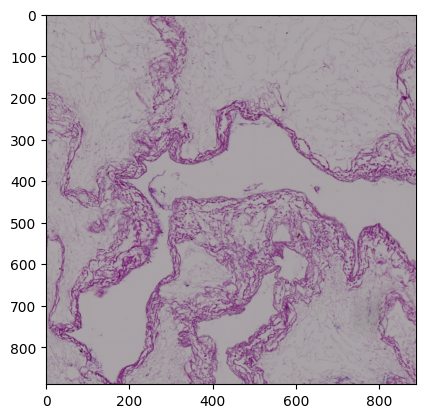

In [ ]:
img = skimage.io.imread("https://i.imgur.com/Vivr3Uv.png")
image = rgba2rgb(img)
plt.imshow(image)

# HSV recolor

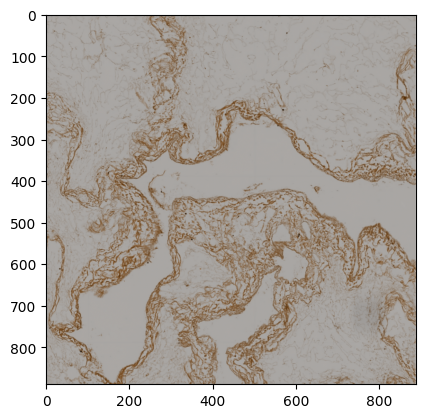

In [ ]:
img_hsv = rgb2hsv(image)

hsv_brown = np.zeros_like(img_hsv)
hsv_brown[..., 0] = 30/360.0  # brown
hsv_brown[..., 1] = img_hsv[..., 1]
hsv_brown[..., 2] = img_hsv[..., 2]
img_brown = hsv2rgb(hsv_brown)

plt.imshow(img_brown)

# Selective HSV recolor

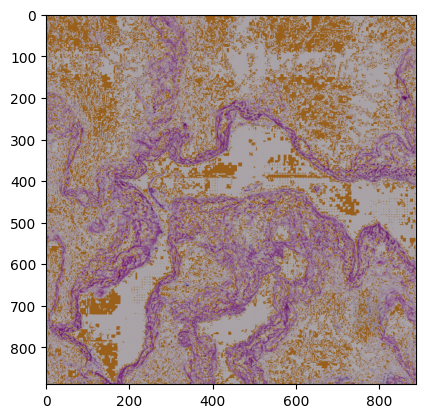

In [ ]:
hsv_image = rgb2hsv(image)

# Define the color range to recolor
cyan_low = np.array([0, 1, 1])
cyan_high = np.array([0.2, 1, 1])


# Define the magenta and brown colors in HSV color space
magenta = np.array([0.83, 1, 1])
brown = np.array([0.09, 0.82, 0.6])

# Set all magenta pixels to brown
mask = np.logical_or(hsv_image[..., 0] < 0.05, hsv_image[..., 0] > 0.9)
hsv_image[..., 0] = np.where(mask, brown[0], hsv_image[..., 0])
hsv_image[..., 1] = np.where(mask, brown[1], hsv_image[..., 1])
hsv_image[..., 2] = np.where(mask, brown[2], hsv_image[..., 2])

# Convert back to RGB color model
new_image = skimage.color.hsv2rgb(hsv_image)
plt.imshow(new_image)

# LAB histogram matching

<ipython-input-16-27cd2909597e>:24: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  matched = exposure.match_histograms(img1_resized_l, img2_l, multichannel=False)


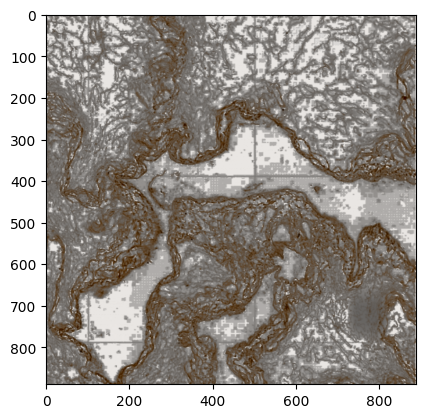

In [ ]:
import numpy as np
from skimage import io, color, filters, exposure, transform

# Load the images
img1 = io.imread('https://i.imgur.com/Vivr3Uv.png')
img2 = io.imread('https://i.imgur.com/3j1Kzut.png')
img1 = rgba2rgb(img1)
img2 = rgba2rgb(img2)

img1 = img_brown

# Resize img1 to match the size of img2
img1_resized = transform.resize(img1, img2.shape[:2], anti_aliasing=True, mode='reflect')

# Convert the images to LAB color space
img1_resized_lab = color.rgb2lab(img1_resized)
img2_lab = color.rgb2lab(img2)

# Extract the L channel from the LAB images
img1_resized_l = img1_resized_lab[:,:,0]
img2_l = img2_lab[:,:,0]

# Match the histograms of the L channels
matched = exposure.match_histograms(img1_resized_l, img2_l, multichannel=False)

# Replace the L channel of img1_resized with the matched L channel
img1_resized_lab[:,:,0] = matched

# Convert the image back to RGB color space
result = color.lab2rgb(img1_resized_lab)

result = transform.resize(result, image.shape[:2], anti_aliasing=True, mode='reflect')

# Save the blended image
plt.imshow(result)

# Rescale LAB matching

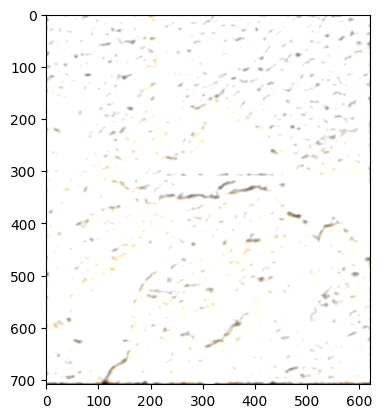

In [ ]:
from skimage import io, color, exposure, transform, feature, filters
from skimage.util import img_as_ubyte

# Texture transfer
# Compute the local binary pattern (LBP) of the L channel of each image
img1_lbp = feature.local_binary_pattern(img1_resized_l, 8, 1)
img2_lbp = feature.local_binary_pattern(img2_l, 8, 1)

# Apply a Gaussian filter to the LBP images to smooth out the texture
img1_lbp_smoothed = filters.gaussian(img1_lbp, sigma=3)
img2_lbp_smoothed = filters.gaussian(img2_lbp, sigma=3)

# Compute the difference in mean intensity between the smoothed LBP images
diff = np.mean(img2_lbp_smoothed) - np.mean(img1_lbp_smoothed)

# Multiply the smoothed LBP image of img1_resized by the difference in mean intensity
# and add it to the smoothed LBP image of img2
img2_lbp_smoothed += diff * img1_lbp_smoothed

# Rescale the pixel values of the LBP image to match the original range of values
img2_lbp_rescaled = exposure.rescale_intensity(img2_lbp_smoothed, out_range=(0, np.max(img2_lbp)))

# Create a new LAB image using the original A and B channels from img1_resized_lab
# and the new L channel from the rescaled LBP image
new_lab = np.dstack((img2_lbp_rescaled, img1_resized_lab[:,:,1], img1_resized_lab[:,:,2]))

# Convert the new LAB image to RGB color space and save the resulting image
new_result = color.lab2rgb(new_lab)

plt.imshow(new_result)

# Pattern transfer

<ipython-input-18-36408deaa276>:21: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  matched = exposure.match_histograms(img1_resized, img2_resized, multichannel=True)


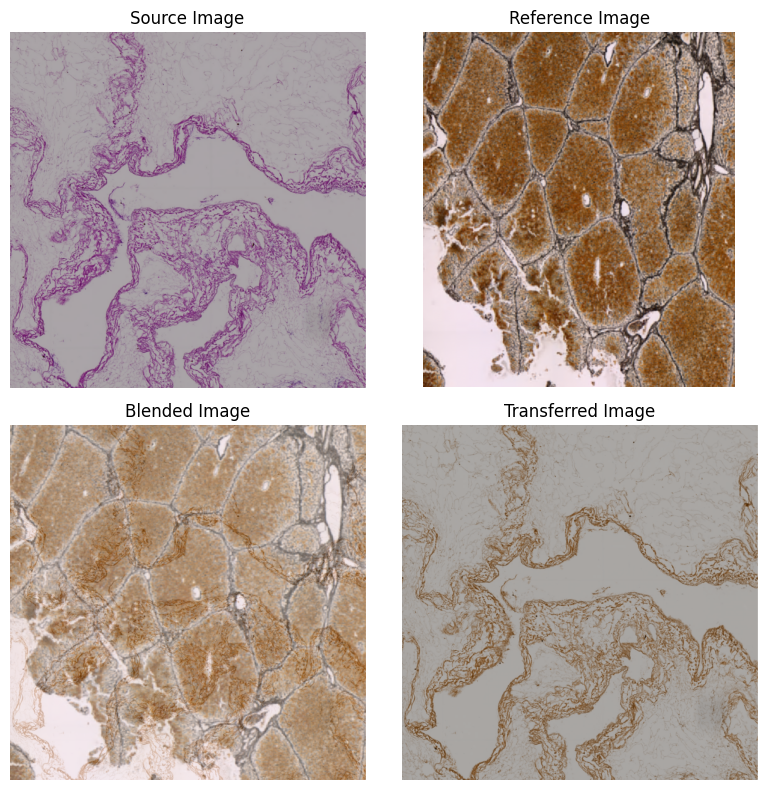

In [ ]:
import numpy as np
from skimage import io, color, exposure, transform, feature, filters
from skimage.exposure import match_histograms

img1 = io.imread('https://i.imgur.com/Vivr3Uv.png')
img2 = io.imread('https://i.imgur.com/3j1Kzut.png')
img1 = rgba2rgb(img1)
img2 = rgba2rgb(img2)

img1 = img_brown

weight = 0.00001

# Resize
h, w, _ = img1.shape
img2_resized = transform.resize(img2, (h, w), anti_aliasing=True, mode='reflect')
img1_resized = transform.resize(img1, (h, w), anti_aliasing=True, mode='reflect')

matched = exposure.match_histograms(img1_resized, img2_resized, multichannel=True)

# Pattern transfer
img2_feat = feature.canny(color.rgb2gray(img2))
img1_feat = feature.canny(color.rgb2gray(img1_resized))
img2_feat = transform.resize(img2_feat, img1_feat.shape, anti_aliasing=False, mode='reflect')
diff = color.gray2rgb(img2_feat) - matched
img1_transferred = np.clip(img1_resized + diff * weight, 0, 1)

alpha = 0.5
blended = (1 - alpha) * img1_transferred + alpha * img2_resized
blended = exposure.rescale_intensity(blended, in_range='image', out_range='dtype')

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
ax = axes.ravel()

ax[0].imshow(img)
ax[0].set_title('Source Image')
ax[1].imshow(img2)
ax[1].set_title('Reference Image')
ax[2].imshow(blended)
ax[2].set_title('Blended Image')
ax[3].imshow(img1_transferred)
ax[3].set_title('Transferred Image')

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

# Evaluation

The results of each method can be evaluated by comparing histograms of the generated images with a sample from the desired domain and by a chi-squared test.

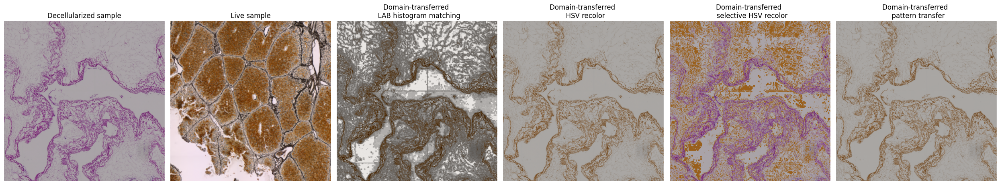

In [ ]:
live_r = transform.resize(io.imread('https://i.imgur.com/3j1Kzut.png'), image.shape[:2], anti_aliasing=True, mode='reflect')

fig, axes = plt.subplots(1, 6, figsize=(25, 10))

axes[0].imshow(image)
axes[0].set_title('Decellularized sample')

axes[1].imshow(live_r)
axes[1].set_title('Live sample')

axes[2].imshow(result)
axes[2].set_title('Domain-transferred \n  LAB histogram matching')

axes[3].imshow(img_brown)
axes[3].set_title('Domain-transferred \n  HSV recolor')

axes[4].imshow(new_image)
axes[4].set_title('Domain-transferred \n  selective HSV recolor')

axes[5].imshow(img1_transferred)
axes[5].set_title('Domain-transferred \n  pattern transfer')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

# LAB histogram matching

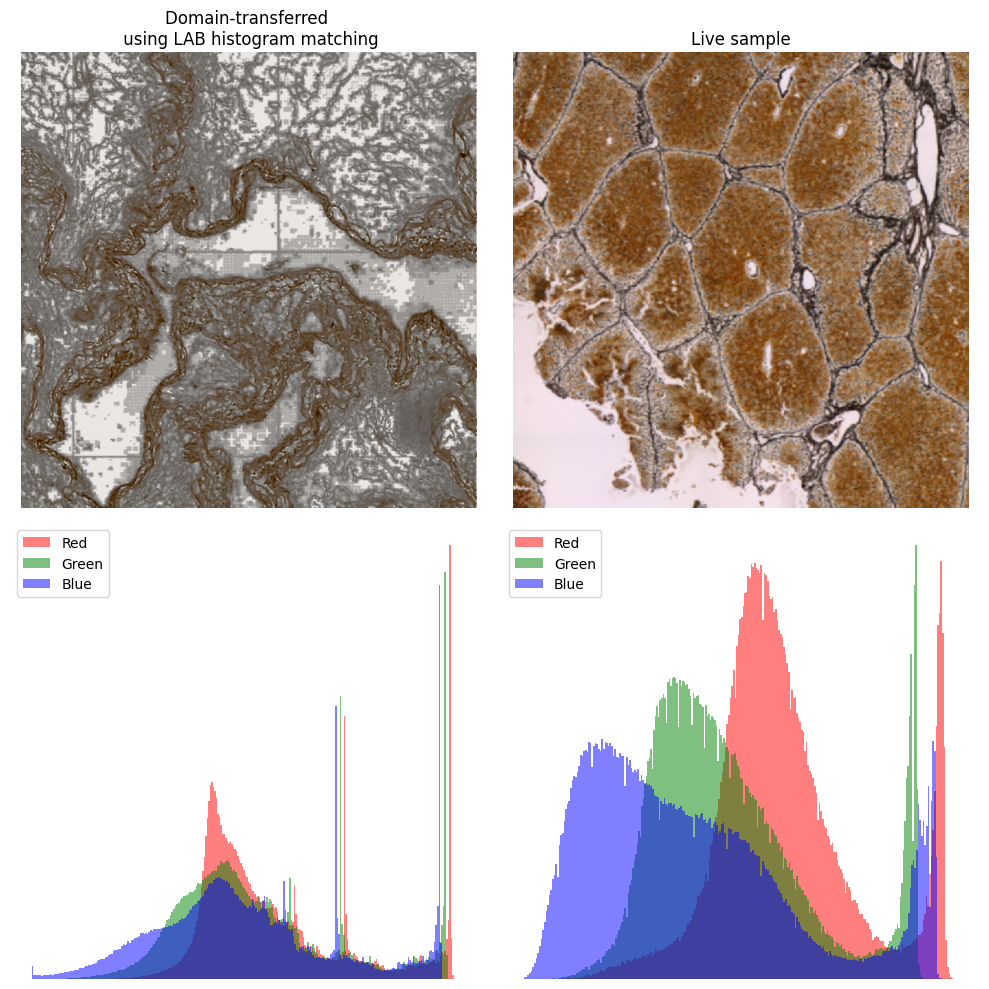

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(result)
axes[0, 0].set_title('Domain-transferred \n using LAB histogram matching')
axes[1, 0].hist(result[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 0].hist(result[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 0].hist(result[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 0].legend()

axes[0, 1].imshow(live_r)
axes[0, 1].set_title('Live sample')
axes[1, 1].hist(live_r[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 1].hist(live_r[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 1].hist(live_r[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 1].legend()

for ax_row in axes[:2]:
    for ax in ax_row:
        ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def compare_hist(result, live_r):
  hist_result_r, _ = np.histogram(result[..., 0].ravel(), bins=256)
  hist_result_g, _ = np.histogram(result[..., 1].ravel(), bins=256)
  hist_result_b, _ = np.histogram(result[..., 2].ravel(), bins=256)

  hist_live_r, _ = np.histogram(live_r[..., 0].ravel(), bins=256)
  hist_live_g, _ = np.histogram(live_r[..., 1].ravel(), bins=256)
  hist_live_b, _ = np.histogram(live_r[..., 2].ravel(), bins=256)

  # chi-square distance for each channel
  chi_sq_r = np.sum((hist_result_r - hist_live_r) ** 2 / (hist_result_r + hist_live_r + 1e-10))
  chi_sq_g = np.sum((hist_result_g - hist_live_g) ** 2 / (hist_result_g + hist_live_g + 1e-10))
  chi_sq_b = np.sum((hist_result_b - hist_live_b) ** 2 / (hist_result_b + hist_live_b + 1e-10))

  # overall chi-square distance
  chi_sq_distance = (chi_sq_r + chi_sq_g + chi_sq_b) / 3.0

  return chi_sq_distance

print("Chi-square distance:", compare_hist(result, live_r))


Chi-square distance: 239006.93537352336


# HSV recolor

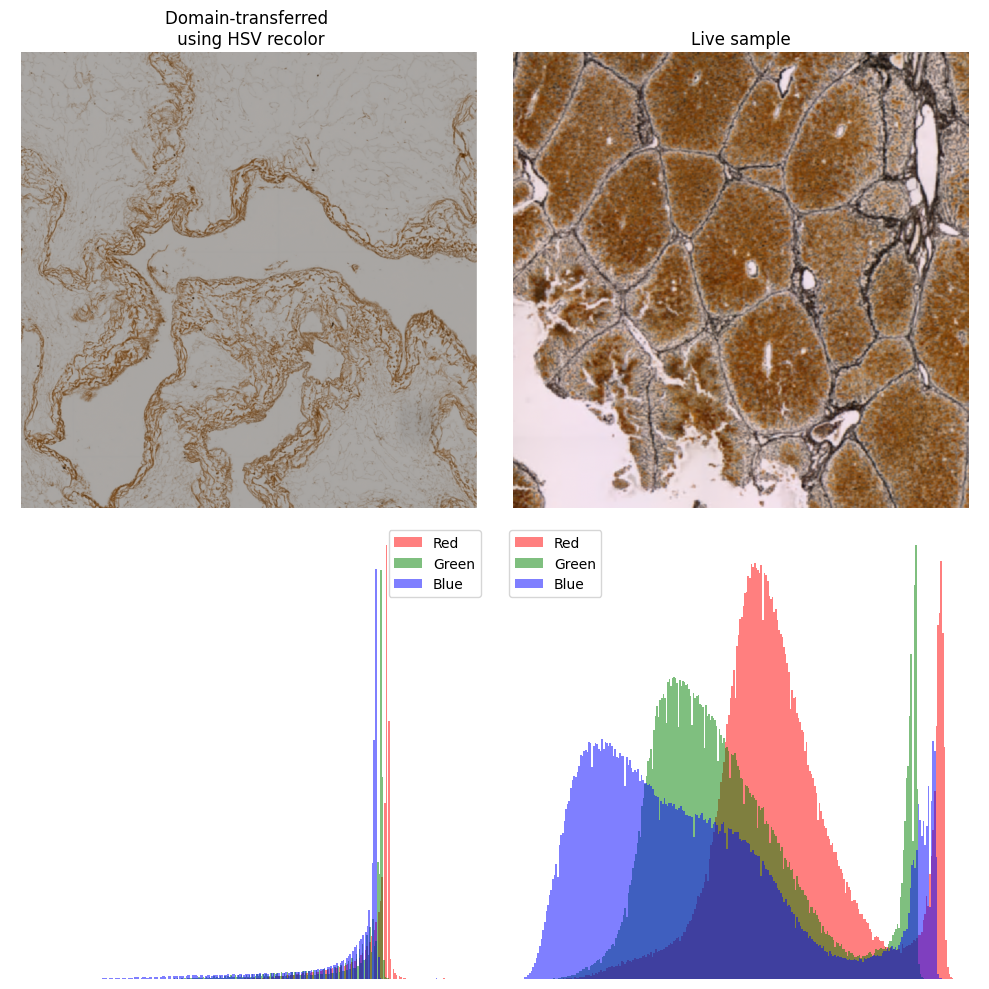

Chi-square distance: 1077247.8062022484


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(img_brown)
axes[0, 0].set_title('Domain-transferred \n using HSV recolor')
axes[1, 0].hist(img_brown[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 0].hist(img_brown[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 0].hist(img_brown[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 0].legend()

axes[0, 1].imshow(live_r)
axes[0, 1].set_title('Live sample')
axes[1, 1].hist(live_r[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 1].hist(live_r[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 1].hist(live_r[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 1].legend()

for ax_row in axes[:2]:
    for ax in ax_row:
        ax.axis('off')

plt.tight_layout()
plt.show()

print("Chi-square distance:", compare_hist(img_brown, live_r))

# selective HSV recolor

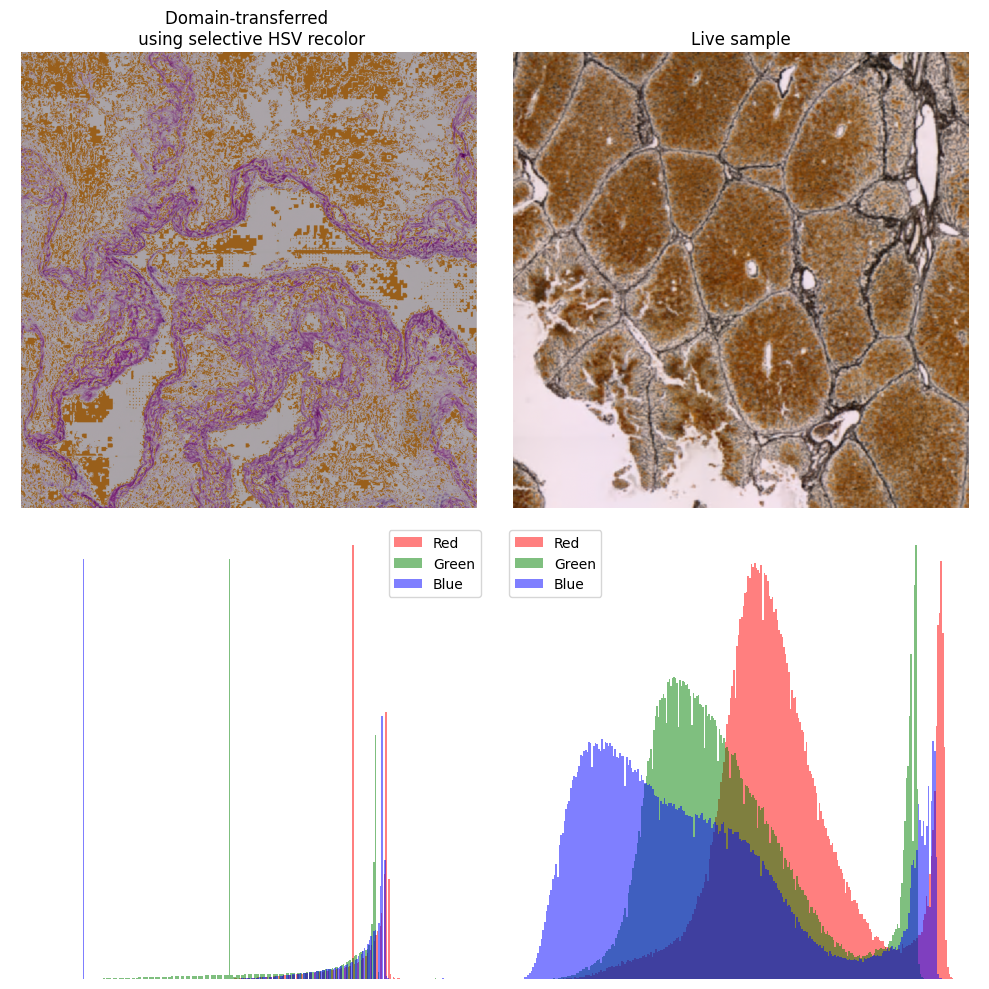

Chi-square distance: 1138826.499419286


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(new_image)
axes[0, 0].set_title('Domain-transferred \n using selective HSV recolor')
axes[1, 0].hist(new_image[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 0].hist(new_image[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 0].hist(new_image[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 0].legend()

axes[0, 1].imshow(live_r)
axes[0, 1].set_title('Live sample')
axes[1, 1].hist(live_r[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 1].hist(live_r[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 1].hist(live_r[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 1].legend()

for ax_row in axes[:2]:
    for ax in ax_row:
        ax.axis('off')

plt.tight_layout()
plt.show()

print("Chi-square distance:", compare_hist(new_image, live_r))

# Pattern transfer

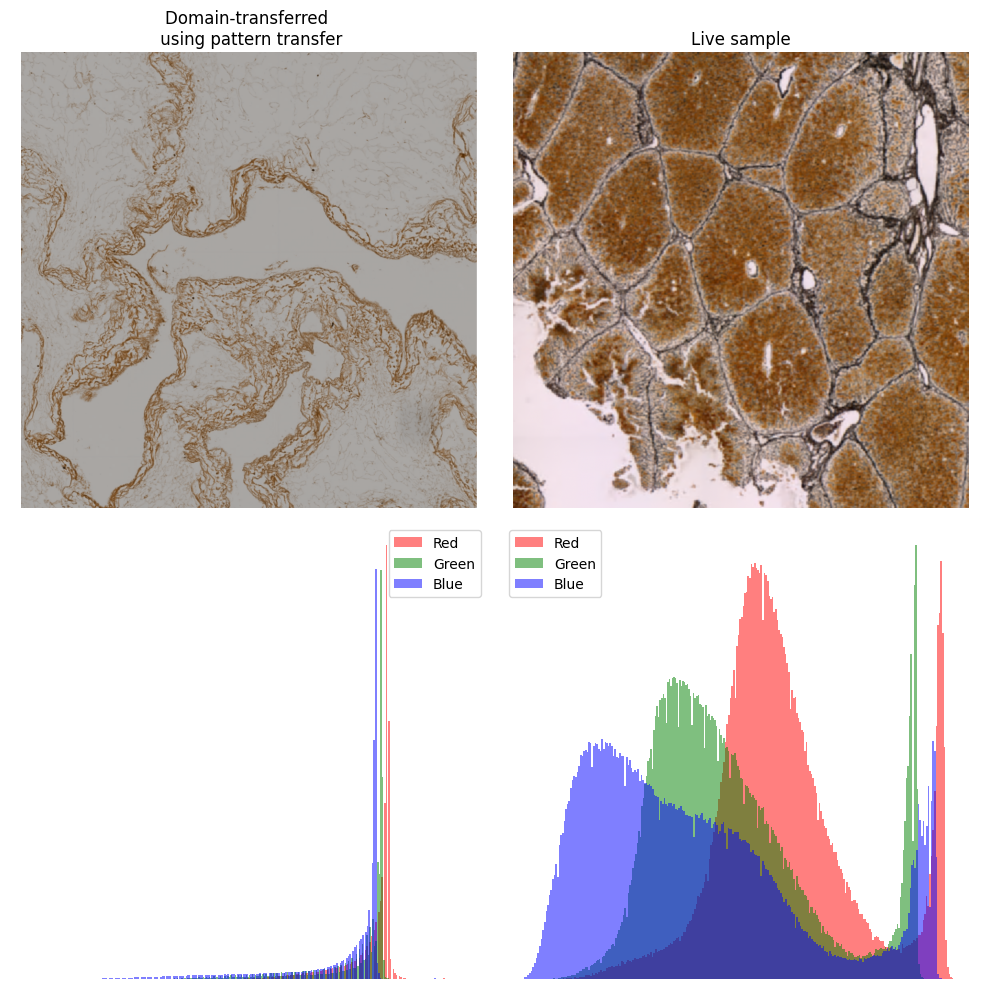

Chi-square distance: 1079395.757755912


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(img1_transferred)
axes[0, 0].set_title('Domain-transferred \n using pattern transfer')
axes[1, 0].hist(img1_transferred[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 0].hist(img1_transferred[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 0].hist(img1_transferred[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 0].legend()

axes[0, 1].imshow(live_r)
axes[0, 1].set_title('Live sample')
axes[1, 1].hist(live_r[..., 0].ravel(), bins=256, color='r', alpha=0.5, label='Red')
axes[1, 1].hist(live_r[..., 1].ravel(), bins=256, color='g', alpha=0.5, label='Green')
axes[1, 1].hist(live_r[..., 2].ravel(), bins=256, color='b', alpha=0.5, label='Blue')
axes[1, 1].legend()

for ax_row in axes[:2]:
    for ax in ax_row:
        ax.axis('off')

plt.tight_layout()
plt.show()

print("Chi-square distance:", compare_hist(img1_transferred, live_r))

# Chi-square test results evaluation

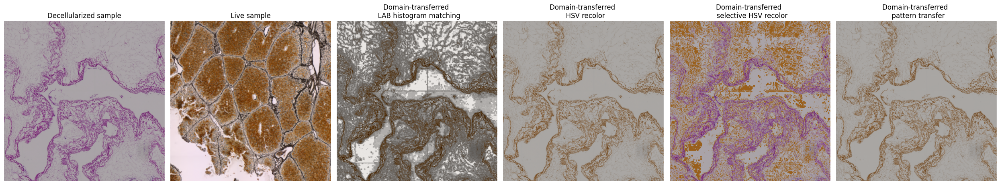

LAB histogram matching: 
2.3901e+05
HSV recolor: 
1.0772e+06
selective HSV recolor: 
1.1388e+06
pattern transfer: 
1.0794e+06


In [ ]:
fig, axes = plt.subplots(1, 6, figsize=(25, 10))

axes[0].imshow(image)
axes[0].set_title('Decellularized sample')

axes[1].imshow(live_r)
axes[1].set_title('Live sample')

axes[2].imshow(result)
axes[2].set_title('Domain-transferred \n  LAB histogram matching')

axes[3].imshow(img_brown)
axes[3].set_title('Domain-transferred \n  HSV recolor')

axes[4].imshow(new_image)
axes[4].set_title('Domain-transferred \n  selective HSV recolor')

axes[5].imshow(img1_transferred)
axes[5].set_title('Domain-transferred \n  pattern transfer')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

print(f'LAB histogram matching: \n{compare_hist(result, live_r):.4e}')

print(f'HSV recolor: \n{compare_hist(img_brown, live_r):.4e}')

print(f'selective HSV recolor: \n{compare_hist(new_image, live_r):.4e}')

print(f'pattern transfer: \n{compare_hist(img1_transferred, live_r):.4e}')
